# Advanced Lane Finding

## Camera Calibration

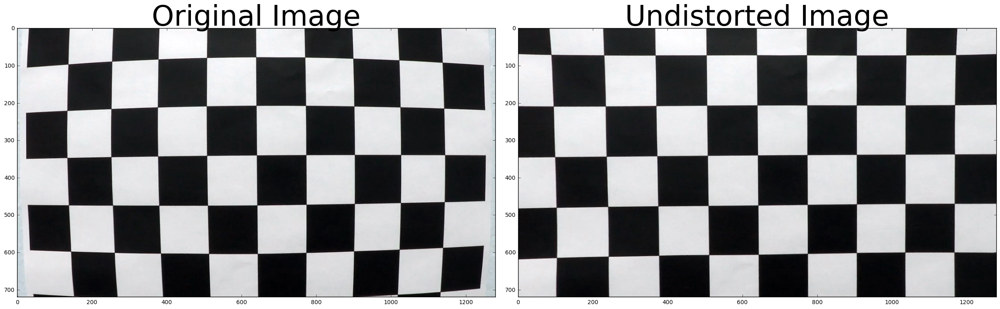

In [1]:
# Import libraries
import glob
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
from scipy import signal
import math

# Define path to calibration and test files
fnames = glob.glob('./camera_cal/calibration*.jpg')
show_img = './camera_cal/calibration{}.jpg'
test_fname = './camera_cal/calibration1.jpg'
fnames.remove(test_fname)

# Define number of corners
nx = 9
ny = 6

# Initialize object points
objpoints = np.zeros((nx * ny, 3), np.float32)
objpoints[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

imgpoints_vec = []
objpoints_vec = []

# Loop through all calibration images
for fname in fnames:
    # Read image
    img = cv2.imread(fname)
    
    # Convert images to greyscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    # If found, draw corners
    if ret == True:
        imgpoints_vec.append(corners)
        objpoints_vec.append(objpoints)
        
        # Draw and display the corners
        if fname == show_img:
            img_corners = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
            plt.imshow(img_corners)
            
# Test on test image
test_img = cv2.imread(test_fname)
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints_vec, imgpoints_vec, test_img.shape[0:2],None,None)
undistorted = cv2.undistort(test_img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Define Functions for Pipeline

In [2]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.

    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    # Defining a blank mask to start with
    mask = np.zeros_like(img)   

    # Defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255

    # Filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)

    # Returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

# Function to apply Sobel
def abs_sobel_thresh(gray, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Take the derivative in x
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0) 
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1) 
    
    # Absolute x derivative to accentuate lines away from horizontal
    abs_sobel = np.absolute(sobel) 
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

    # Threshold gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return sxbinary

# Function to compute the magnitude of the gradient
def mag_thresh(gray, sobel_kernel=3, mag_thresh=(0, 255)):
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale 
    scaled_gradmag = np.uint8(255*gradmag/np.max(gradmag))
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(scaled_gradmag)
    binary_output[(scaled_gradmag >= mag_thresh[0]) & (scaled_gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

# Function to threshold an image for a given range and Sobel kernel
def dir_threshold(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

## Create Pipeline

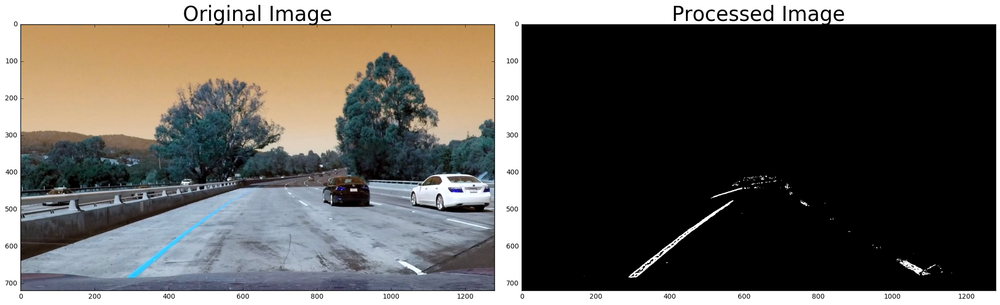

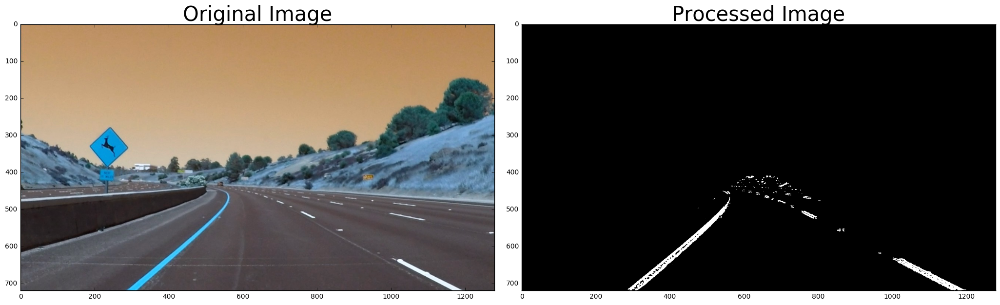

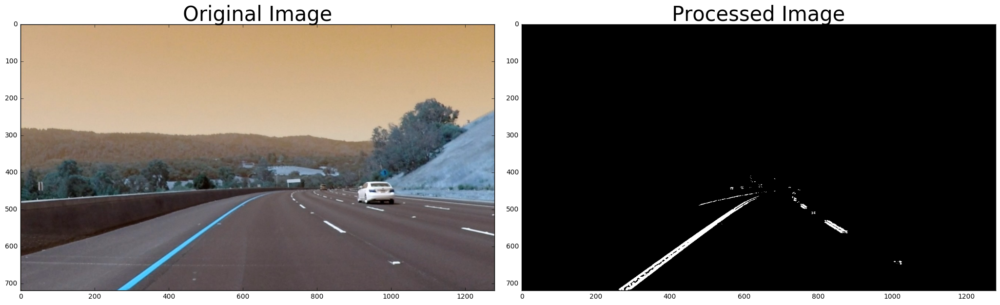

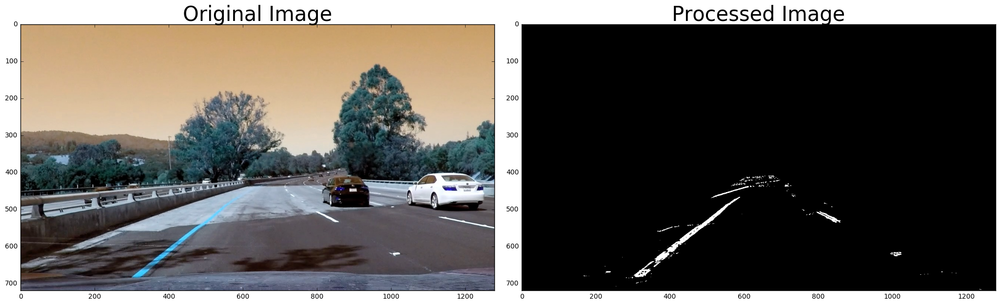

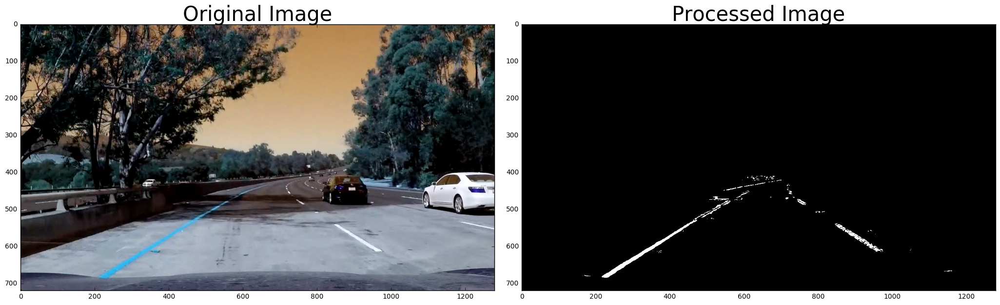

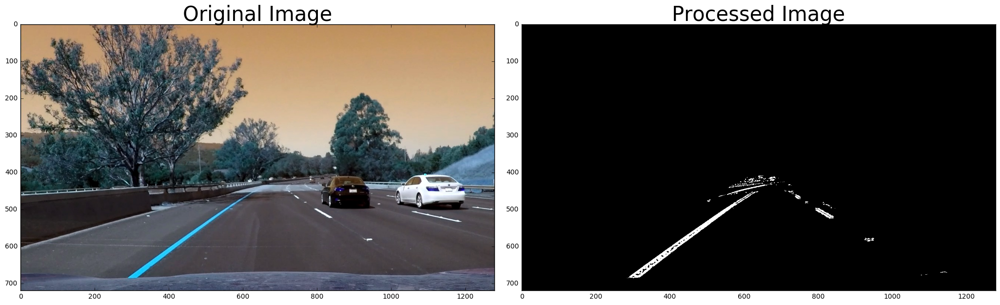

In [3]:
# Process image
def pipeline(img):
    # Apply Gaussian Blur
    kernel_size = 5
    img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
    # Convert to binary image
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Define Sobel kernel size
    ksize = 7
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(gray, orient='x', sobel_kernel=ksize, thresh=(10, 250))
    grady = abs_sobel_thresh(gray, orient='y', sobel_kernel=ksize, thresh=(60, 255))
    mag_binary = mag_thresh(gray, sobel_kernel=ksize, mag_thresh=(40, 255))
    dir_binary = dir_threshold(gray, sobel_kernel=ksize, thresh=(0.65, 1.05))
    # Combine thresholding information
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    # Apply threshold to color channel
    s_binary = np.zeros_like(combined)
    s_binary[(S > 160) & (S < 255)] = 1
    # Convert to binary images   
    color_binary = np.zeros_like(combined)
    color_binary[(s_binary > 0) | (combined > 0)] = 1
    # Define vertices for marked area
    left_b = (100, img.shape[0])
    right_b = (img.shape[1]-20, img.shape[0])
    apex1 = (610, 410)
    apex2 = (680, 410)
    inner_left_b = (310, img.shape[0])
    inner_right_b = (1150, img.shape[0])
    inner_apex1 = (700,480)
    inner_apex2 = (650,480)
    vertices = np.array([[left_b, apex1, apex2, right_b, inner_right_b, \
                          inner_apex1, inner_apex2, inner_left_b]], dtype=np.int32)
    # Select region of interest
    color_binary = region_of_interest(color_binary, vertices)
    return color_binary

for i in range(1,7):
    fname = './test_images/test{}.jpg'.format(i)
    img = cv2.imread(fname)
    processed_img = pipeline(img)

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    f.tight_layout()

    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)

    ax2.imshow(processed_img, cmap='gray')
    ax2.set_title('Processed Image', fontsize=30)
   
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Define Line Class

In [4]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        #x values in windows
        self.windows = np.ones((3,12))*-1

## Define Functions for Finding Lanes

In [15]:
# Define area of interest
area_of_interest = [[580,460],[710,460],[1150,720],[150,720]]

# Define function to unwarp image
def unwarp_image(img, nx, ny, mtx, dist):
    # Remove distortion from image
    undistorted_img = cv2.undistort(img, mtx, dist, None, mtx)
    # Choose offsets from image corners
    offset1 = 200
    offset2 = 0
    offset3 = 0
    # Get image shape
    img_size = (gray.shape[1], gray.shape[0])
    # Get source and destination points
    src = np.float32([[580,460],[710,460],[1150,720],[150,720]])
    dst = np.float32([[offset1, offset3], 
                      [img_size[0]-offset1, offset3], 
                      [img_size[0]-offset1, img_size[1]-offset2], 
                      [offset1, img_size[1]-offset2]])
    
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)
    # Get warped image
    warped = cv2.warpPerspective(undistorted_img, M, img_size)
    
    return warped, M, M_inv


# Define function to fit curve to lane
def get_curvature(yvals, fitx):
    # y-value location of radius of curvature
    y_eval = np.max(yvals)
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    fit_cr = np.polyfit(yvals*ym_per_pix, fitx*xm_per_pix, 2)
    curverad = ((1 + (2*fit_cr[0]*y_eval + fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*fit_cr[0])
    return curverad

# Define function to get position
def get_position(img,pts):
    # Find position of car from center
    image_shape = img.shape
    position = image_shape[1]/2
    left  = np.min(pts[(pts[:,1] < position) & (pts[:,0] > 700)][:,1])
    right = np.max(pts[(pts[:,1] > position) & (pts[:,0] > 700)][:,1])
    center = (left + right)/2
    # Define conversions in x and y from pixels space to meters
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension    
    return (position - center)*xm_per_pix

# Define function to find nearest point from array
def get_nearest(array,value):
    if len(array) > 0:
        idx = (np.abs(array-value)).argmin()
        return array[idx]

# Find the historgram from image and get max
def get_peaks(img, ytop, ybottom, xleft, xright):
    
    histogram = np.sum(img[ytop:ybottom,:], axis=0)
    # Get max
    if len(histogram[int(xleft):int(xright)])>0:
        return np.argmax(histogram[int(xleft):int(xright)]) + xleft
    else:
        return (xleft + xright) / 2  

# Define function for sanity check
def sanity_check(lane, curverad, fitx, fit):       
    # If lane is detected
    if lane.detected: 
        if abs(curverad / lane.radius_of_curvature - 1) < .6:        
            lane.detected = True
            lane.current_fit = fit
            lane.allx = fitx
            lane.bestx = np.mean(fitx)            
            lane.radius_of_curvature = curverad
            lane.current_fit = fit
        # Else use the previous values
        else:
            lane.detected = False
            fitx = lane.allx
    # If lane not detected and no curvature defined
    else:
        if lane.radius_of_curvature: 
            if abs(curverad / lane.radius_of_curvature - 1) < 1:            
                lane.detected = True
                lane.current_fit = fit
                lane.allx = fitx
                lane.bestx = np.mean(fitx)            
                lane.radius_of_curvature = curverad
                lane.current_fit = fit
            else:
                lane.detected = False
                fitx = lane.allx      
        # If curvature defined
        else:
            lane.detected = True
            lane.current_fit = fit
            lane.allx = fitx
            lane.bestx = np.mean(fitx)
            lane.radius_of_curvature = curverad
    return fitx

# Sanity check for the direction
def sanity_check_direction(right, right_pre, right_pre_pre):
    # Pass if correct direction
    if abs((right-right_pre) / (right_pre-right_pre_pre) - 1) < .2:
        return right
    # Else use the previous values
    else:
        return right_pre + (right_pre - right_pre_pre)

# Define function to find lines
def get_lanes(n, img, x_window, lanes, left_x, left_y, right_x, right_y, segment_ind):
    point1 = np.zeros((n+1,2))
    point1[0] = [300, 1100]
    point1[1] = [300, 1100]
    # Assign left and right values
    left, right = (300, 1100)
    # Assign center
    center = 700
    # Assign previous center
    center_pre = center
    # Assign direction
    direction = 0
    for i in range(0, n-1):
        # Set range
        y_top = 720-720/n*(i+1)
        y_bottom = 720-720/n*i
        # If left and right lanes detected
        if (left_lane.detected==False) and (right_lane.detected==False):
            # Get histogram
            left  = get_peaks(img, y_top, y_bottom, point1[i+1,0]-200, point1[i+1,0]+200)
            right = get_peaks(img, y_top, y_bottom, point1[i+1,1]-200, point1[i+1,1]+200)
            # Set direction
            left  = sanity_check_direction(left, point1[i+1,0], point1[i,0])
            right = sanity_check_direction(right, point1[i+1,1], point1[i,1]) 
            # Set center
            center_pre = center
            center = (left + right)/2
            direction = center - center_pre
        # If both lanes detected 
        else:
            left  = left_lane.windows[segment_ind, i]
            right = right_lane.windows[segment_ind, i]
        # Double check distance between lanes
        if abs(left-right) > 600:
            # Add coordinates to left lane arrays
            left_lane_array = lanes[(lanes[:,1]>=left-x_window) & (lanes[:,1]<left+x_window) &
                                 (lanes[:,0]<=y_bottom) & (lanes[:,0]>=y_top)]
            left_x += left_lane_array[:,1].flatten().tolist()
            left_y += left_lane_array[:,0].flatten().tolist()
            if not math.isnan(np.mean(left_lane_array[:,1])):
                left_lane.windows[segment_ind, i] = np.mean(left_lane_array[:,1])
                point1[i+2,0] = np.mean(left_lane_array[:,1])
            else:
                point1[i+2,0] = point1[i+1,0] + direction
                left_lane.windows[segment_ind, i] = point1[i+2,0]
            # Append coordinates to the right lane arrays            
            right_lane_array = lanes[(lanes[:,1]>=right-x_window) & (lanes[:,1]<right+x_window) &
                                  (lanes[:,0]<y_bottom) & (lanes[:,0]>=y_top)]
            right_x += right_lane_array[:,1].flatten().tolist()
            right_y += right_lane_array[:,0].flatten().tolist()
            if not math.isnan(np.mean(right_lane_array[:,1])):
                right_lane.windows[segment_ind, i] = np.mean(right_lane_array[:,1])
                point1[i+2,1] = np.mean(right_lane_array[:,1])
            else:
                point1[i+2,1] = point1[i+1,1] + direction
                right_lane.windows[segment_ind, i] = point1[i+2,1]
    return left_x, left_y, right_x, right_y

def fit_lanes(img):
    # Define y values for plotting
    yvals = np.linspace(0, 100, num=101)*7.2 
    # Get coordinates from image
    lanes = np.argwhere(img)
    # Coordinates for left lane
    left_x = []
    left_y = []
    # Coordinates for right lane
    right_x = []
    right_y = []
    # Initialize curve
    curve = 0
    # Assign left and right as None
    left = None
    right = None
    # Find lanes
    left_x, left_y, right_x, right_y = get_lanes(4, img, 25, lanes, \
                                    left_x, left_y, right_x, right_y, 0)
    left_x, left_y, right_x, right_y = get_lanes(6, img, 50, lanes, \
                     left_x, left_y, right_x, right_y, 1)
    left_x, left_y, right_x, right_y = get_lanes(8, img, 75, lanes, \
                     left_x, left_y, right_x, right_y, 2)
    
    # Get coefficients of polynomials
    left_fit = np.polyfit(left_y, left_x, 2)
    left_fitx = left_fit[0]*yvals**2 + left_fit[1]*yvals + left_fit[2]
    right_fit = np.polyfit(right_y, right_x, 2)
    right_fitx = right_fit[0]*yvals**2 + right_fit[1]*yvals + right_fit[2]
    # Find curvatures
    left_curverad  = get_curvature(yvals, left_fitx)
    right_curverad = get_curvature(yvals, right_fitx)
    # Do sanity checks
    left_fitx  = sanity_check(left_lane, left_curverad, left_fitx, left_fit)
    right_fitx = sanity_check(right_lane, right_curverad, right_fitx, right_fit)
    
    return yvals, left_fitx, right_fitx, left_x, left_y, right_x, right_y, left_curverad

# Define function to draw polynomial on an image
def draw_poly(img, warped, yvals, left_fitx, right_fitx, 
              left_x, left_y, right_x, right_y, Minv, curvature):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    # Put text on an image
    font = cv2.FONT_HERSHEY_PLAIN
    text = "Radius of Curvature: {} m".format(int(curvature))
    cv2.putText(result,text,(400,100), font, 1,(255,255,255),2)
    # Find the position of the car
    pts = np.argwhere(newwarp[:,:,1])
    position = get_position(img,pts)
    if position < 0:
        text = "Vehicle is {:.2f} m left of center".format(-position)
    else:
        text = "Vehicle is {:.2f} m right of center".format(position)
    cv2.putText(result,text,(400,150), font, 1,(255,255,255),2)
    return result

## Define Function to Process Image

In [16]:
def process_image(image):
    # Put image through pipline
    img = pipeline(image)
    # Warp image to make lanes parallel to each other
    birds_eye, perspective_M, perspective_Minv = unwarp_image(img, nx, ny, mtx, dist)
    # Find the lines
    a, b, c, lx, ly, rx, ry, curvature = fit_lanes(birds_eye)
    # Return original image with colored region
    return draw_poly(image, birds_eye, a, b, c, lx, ly, rx, ry, perspective_Minv, curvature)

## Draw Images

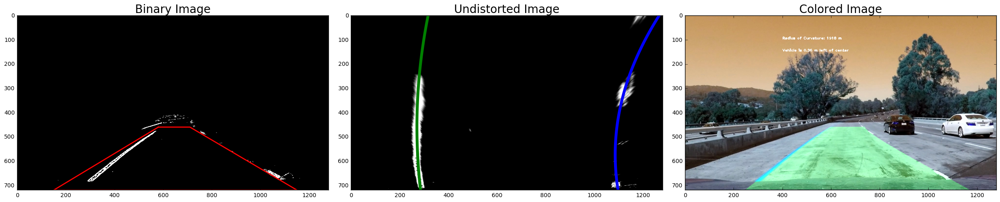

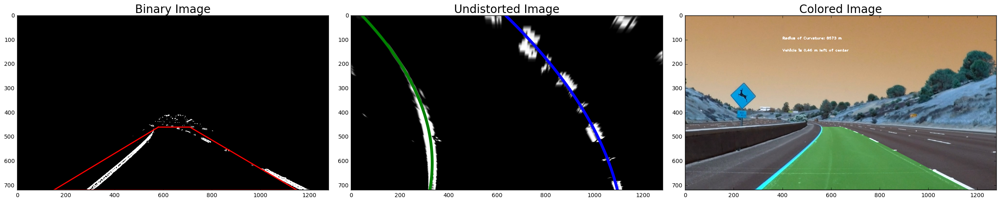

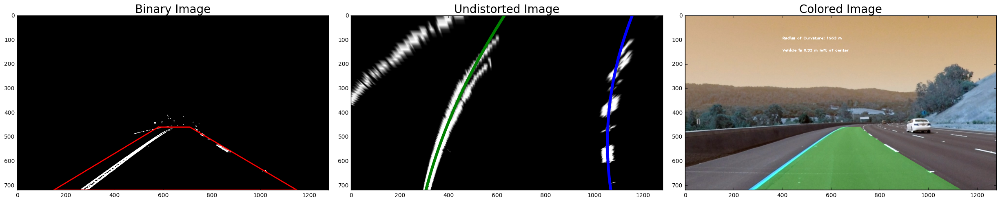

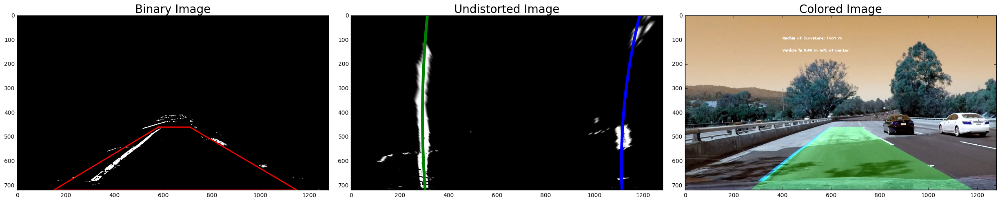

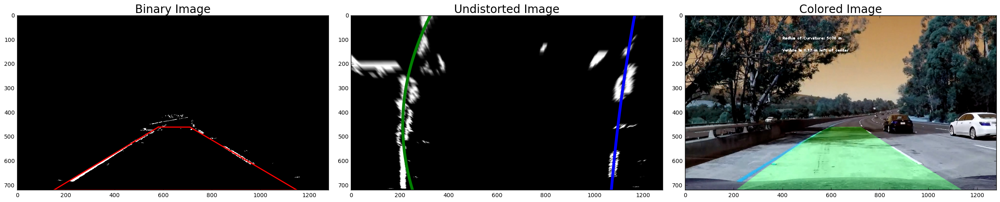

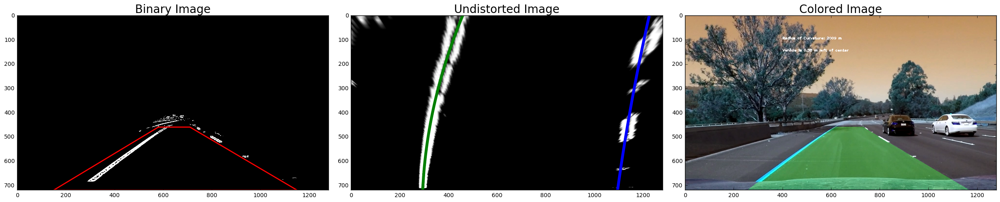

In [17]:
# Hide warnings
import warnings
warnings.filterwarnings('ignore')

# Used to plot lines on images
x_values = [area_of_interest[0][0],area_of_interest[1][0],area_of_interest[2][0],area_of_interest[3][0],area_of_interest[0][0]]
y_values = [area_of_interest[0][1],area_of_interest[1][1],area_of_interest[2][1],area_of_interest[3][1],area_of_interest[0][1]]

# Loop through test images
for i in range(1,7):
    # Initialize lines for left and right
    left_lane = Line()
    right_lane = Line()
    # Load image
    fname = 'test_images/test{}.jpg'.format(i)
    img_raw = cv2.imread(fname)
    # Apply pipeline to the image to create binary image
    img = pipeline(img_raw)
    # Unwrap the image
    birds_eye, perspective_M, perspective_Minv = unwarp_image(img, nx, ny, mtx, dist)
    # Set Subplots
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()
    # Show image 
    ax1.set_title('Binary Image', fontsize=20)
    ax1.plot(x_values,y_values,'r-',lw=2)
    ax1.imshow(img, cmap='gray')
    # Find lanes 
    a, b, c, _, _, _, _, _ = fit_lanes(birds_eye)
    ax2.plot(b, a, color='green', linewidth=5)
    ax2.plot(c, a, color='blue', linewidth=5)
    ax2.imshow(birds_eye, cmap='gray')
    ax2.set_title('Undistorted Image', fontsize=20)
    # Set up lines for left and right
    left_lane = Line()
    right_lane = Line()    
    # Color lanes
    image_color = process_image(img_raw)
    ax3.imshow(image_color)
    ax3.set_title('Colored Image', fontsize=20)
    # Adjust subplots
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Show in Video

In [18]:
### Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
# Set up lines for left and right
left_lane = Line()
right_lane = Line()
white_output = 'output.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video output.mp4
[MoviePy] Writing video output.mp4


100%|█████████▉| 1260/1261 [06:33<00:00,  3.18it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output.mp4 

CPU times: user 6min 41s, sys: 1min 15s, total: 7min 56s
Wall time: 6min 34s
